# SIFT 알고리즘


이미지의 크기 및 회전에 영향을 받지 않는 특징점들을 추출하는 알고리즘


기본 개념은 서로 다른 두 이미지에서 SIFT 특징을 추출하고, 비슷한 특징점 끼리 매칭하면 이미지가 회전해 있더라도 이미지에서 동일한 이미지를 추출할 수 있다.


주로 유사도 평가 혹은 이미지 정합(예 파노라마 영상)에 활용되지만, 연산 속도가 느리다는 단점이 존재한다.
    

구체적인 동작 원리는 아래와 같이 총 4단계로 구성되어있다.
   
1. Scale-space 


2. Keypoint localication


3. Orientation assignment


4. Keypoint descriptor



## 1. Scale-space 만들기

Scale-space를 만들어 극점들을 검출하는 단계이다.

아래와 같은 순서로 진행된다.


1. 아래와 같이 원본 이미지를 여러 크기로 사이즈를 변경해서 이미지 피라미드를 만든다.


![출처: 위키피디아](./img/sift/img_pyramid.png)
*출처 : 위키디피아*


2. 각 층의 이미지에 가우시안 블러를 적용한다. 이렇게 만들어진 피라미드를 Scale-space라고 부른다.


3. Difference of Gaussian을 적용한다.


아래와 같이 가우시안 블러가 적용된 이미지들을 빼기 연산을 통해 DoG 이미지를 생성한다.

![dog](./img/sift/dog.png)




4. DoG를 이용해 Extrema Detection을 수행하여 해당 좌표가 극소점 혹은 극대점 인지 주변 26개의 픽셀값과 비교하여 판단한다.만약 극점이라고 판단된다면 그 좌표를 Keypoint 후보군으로 분류한다.


![Extrema](./img/sift/Extrema.png)


## 2. Keypoint localization - 불필요한 키포인트 삭제

해당 Keypoint 후보군 중 유용한 점들만을 가려내기 위해 후처리를 진행한다.

이후 후처리된 Keypoint들은 scale invariance을 가진다.

## 3. Orientation assignment - 방향 할당하기

해당 Keypoint들은 아직 방향을 가지고 있지 않다. 따라서 이 단계에서는 Keypoint들의 방향을 결정한다.

아래 식을 통해 가우시안 블러를 적용했던 이미지에서 Gradient magnitude와 Gradient orientation을 구한다.


![Ori](./img/sift/ori.png)


구한 두 값들을 바탕으로 Keypoint에서 36개의 bin을 가지는 orientation histogram 을 생성하고, 가장 높은 bin값의 방향을 Keypoint의 방향으로 설정한다.

![Ori2](./img/sift/ori2.png)

## 4. Keypoint descriptor - 최종적으로 SIFT 특징 산출하기

Keypoint descriptor 을 생성하며, 이 Keypoint descriptor 은 아래과 같이 16 * 16 path에서 8방향 정보가 16개가 생성되어 총 128개의 값을 가지게 된다.


![Keypoint descriptor](./img/sift/Keypointdescriptor.png)


# Code

https://github.com/opencv/opencv/blob/master/samples/python/find_obj.py

위 코드를 참고했습니다.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

#cv2.SIFT_create()로  SIFT detector 선언
detector = cv2.SIFT_create()

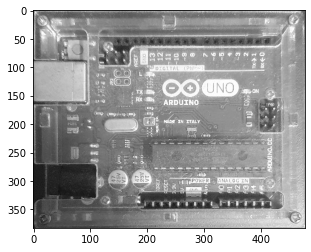

In [2]:
#찾을 이미지 그레이스케일 이미지 사용
goal = cv2.imread('./img/sift/goal.PNG',cv2.IMREAD_GRAYSCALE)
plt.imshow(goal,cmap='gray')

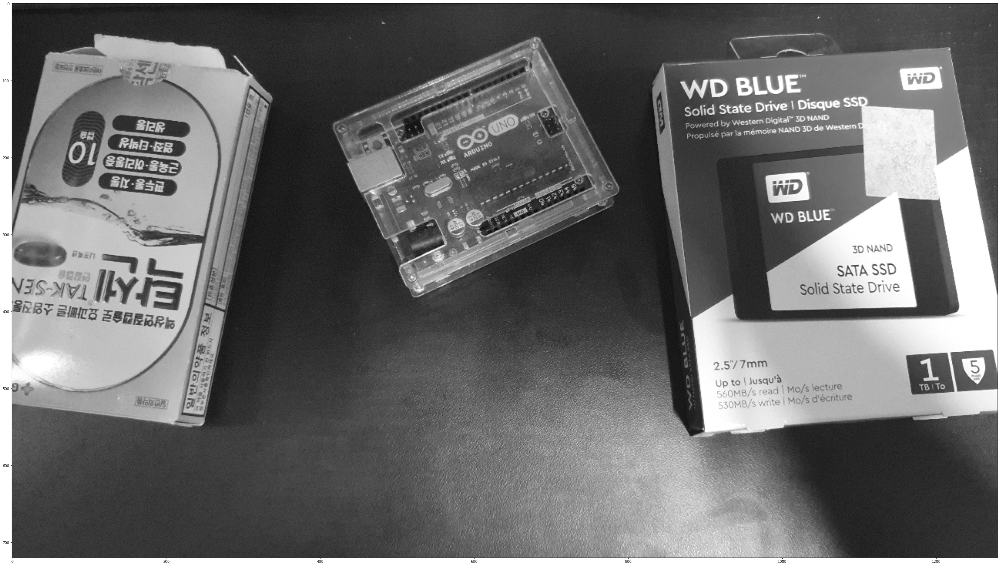

In [3]:
#찾을 대상 이미지 그레이스케일 이미지 사용
target = cv2.imread('./img/sift/target.jpg',cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(50,50))
plt.imshow(target,cmap='gray')

In [4]:
#특징점들을 검출해냄
kp1,desc1 = detector.detectAndCompute(goal,None)
kp2,desc2 = detector.detectAndCompute(target,None)

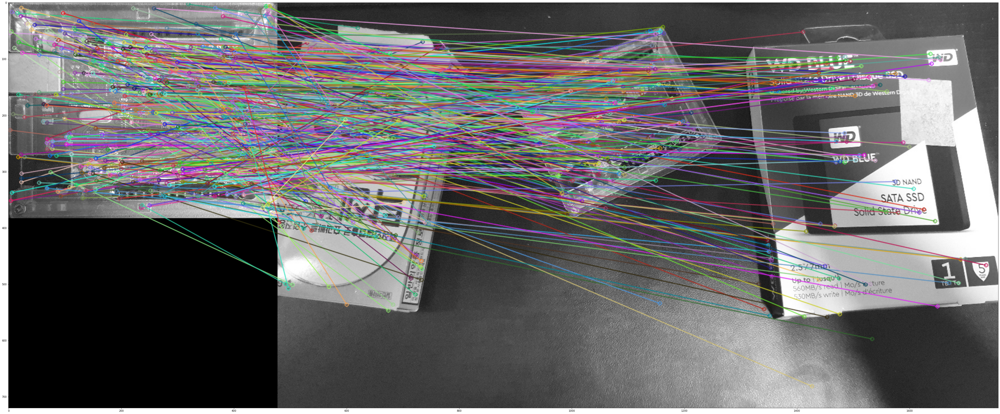

In [5]:
#검출한 특징점들을 매칭하고 그림
#아래 코드는 단순 매칭임
matcher = cv2.BFMatcher(cv2.NORM_L1,crossCheck = True)
matches = matcher.match(desc1,desc2)
simple_match = cv2.drawMatches(goal, kp1, target, kp2, matches, None, 
                      flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(70,70))
plt.imshow(simple_match)

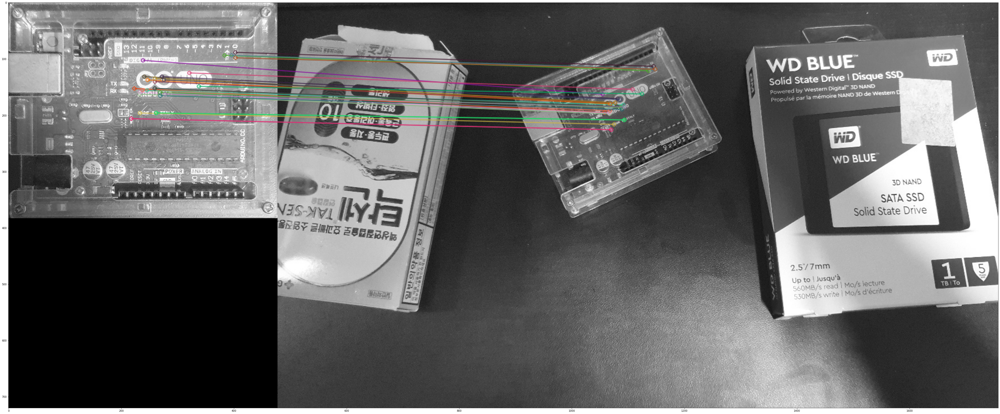

In [6]:
#검출한 특징점들을 매칭하고 그림
#아래 코드는 Knn 매칭으로 좋지 못한 특징점들을 걸러낼 수 있음
matcher = cv2.BFMatcher()
matches = matcher.knnMatch(desc1,desc2,k=2)
good = []
for m,n in matches:
    if m.distance < 0.6*n.distance:
        good.append([m])
        
knn_match = cv2.drawMatchesKnn(goal,kp1,target,kp2,good,None,flags=2) 
plt.figure(figsize=(70,70))
plt.imshow(knn_match)

이미지 출처들

이미지 피라미드 : 위키피디아
DoG : https://www.researchgate.net/figure/Difference-of-Gaussian-DoG-Pyramid-and-Extrema-Selection_fig4_316677578


Extrema Detecction : https://www.researchgate.net/figure/Scale-space-extrema-detection-process-16_fig3_309478756


orientation 수식 : https://link.springer.com/article/10.1023%2FB%3AVISI.0000029664.99615.94
orientation : https://bskyvision.com/21

Keypointdescriptor:https://www.researchgate.net/publication/4351572_Boosting_of_factorial_correspondence_analysis_for_image_retrieval